In [78]:
import numpy as np
import matplotlib.pyplot as plt
from numba import njit
from numba.typed import List
import numpy.fft as fft

@njit
def pbc_dist(a, b, P):
    d = abs(a-b)
    return min(d, P-d)
@njit
def move_front(u, delta, origin, k, M):
    L = len(u)
    for i in range(k):
        idx = (i+origin)%L
        new_u = (u[idx] + delta)%M
        u[idx] = new_u


@njit
def check_front(u, V, delta, origin, k):
    L = V.shape[0]
    M = V.shape[1]
    left_d = pbc_dist(u[origin], u[(origin-1)%L], M)
    right_d = pbc_dist(u[(origin + k-1)%L],  u[(origin+k)%L], M)
    if(left_d >= 1 or right_d >= 1):
        return 0, False
    dE = 1.0
    for i in range(k):
        u_i = u[(origin+i)%L]
        dE = dE +  (V[i, (u_i+delta) % M] - V[i, u_i])
    return dE, True


np.random.seed(0)
L = 512
M = 2*L
V = np.random.normal(size=(L, M))
u = np.zeros(L, dtype=int) #indices along M
f = 0.0

In [76]:
step = 0
while(step < L):
    min_df = np.infty
    moved = False
    move_origin = -1
    move_k = -1
    for k in np.arange(2, L):
        if(moved):
            break
        for origin in np.arange(0, L):
            if(moved):
                break
            for delta in [-1, 1]:
                if(moved):
                    break
                dE, front_status = check_front(u, V, delta,origin, k)
                if(front_status): # the move does violate the metric constraint
                    dE = dE - f*k*delta
                    if(dE<0):
                        move_front(u, delta, origin, k, M)
                        move_origin = origin
                        move_k = k
                        moved = True
                    else:
                        candidate_df = dE/(delta*k)
                        if(candidate_df > 0):
                            min_df = min(min_df, candidate_df)
                else:
                    break
    if(not moved):
        if(not np.isfinite(min_df)):
            print("Error")
            break
        f += min_df
    else:
        step += 1 

Error


In [79]:
for k in np.arange(1, L//2):
    for origin in np.arange(0, L):
        print(k, origin, *check_front(u, V, 1, origin, k))
        print(k, origin, *check_front(u, V, -1, origin, k))

1 0 -0.3638951376004407 True
1 0 -1.8615490007379085 True
1 1 -0.3638951376004407 True
1 1 -1.8615490007379085 True
1 2 -0.3638951376004407 True
1 2 -1.8615490007379085 True
1 3 -0.3638951376004407 True
1 3 -1.8615490007379085 True
1 4 -0.3638951376004407 True
1 4 -1.8615490007379085 True
1 5 -0.3638951376004407 True
1 5 -1.8615490007379085 True
1 6 -0.3638951376004407 True
1 6 -1.8615490007379085 True
1 7 -0.3638951376004407 True
1 7 -1.8615490007379085 True
1 8 -0.3638951376004407 True
1 8 -1.8615490007379085 True
1 9 -0.3638951376004407 True
1 9 -1.8615490007379085 True
1 10 -0.3638951376004407 True
1 10 -1.8615490007379085 True
1 11 -0.3638951376004407 True
1 11 -1.8615490007379085 True
1 12 -0.3638951376004407 True
1 12 -1.8615490007379085 True
1 13 -0.3638951376004407 True
1 13 -1.8615490007379085 True
1 14 -0.3638951376004407 True
1 14 -1.8615490007379085 True
1 15 -0.3638951376004407 True
1 15 -1.8615490007379085 True
1 16 -0.3638951376004407 True
1 16 -1.8615490007379085 True


In [1]:
import matplotlib.pyplot as plt
import numpy as np
from numba import njit
import pandas as pd
from scipy.stats import binned_statistic, linregress, bootstrap

In [53]:
params = [
        (0.01, 0.0, 0.1),
        (0.01, 0.0, 0.2), 
        (0.01, 0.0, 0.3),
        (0.01, 0.1, 0.1),
        (0.01, 0.1, 0.2),
        (0.01, 0.1, 0.3),
        (0.01, 0.2, 0.1),
        (0.01, 0.2, 0.2),
        (0.01, 0.2, 0.3),
        (0.01, 0.3, 0.1),
        (0.01, 0.3, 0.2),
        (0.01, 0.3, 0.3),
        (0.01, 0.4, 0.1),
        (0.01, 0.4, 0.2),
        (0.01, 0.4, 0.3),
        (0.01, 0.5, 0.1),
        (0.01, 0.5, 0.2),
        (0.01, 0.5, 0.3)]

In [55]:
data_dict = {}
events_dict = {}
for p in params:
    data_dict[p] = np.loadtxt("visco/recording_L=512_k0=%g_k1=%g_k2=%g.txt" % p, delimiter=" ")
    snaps = np.fromfile("visco/recording_L=512_k0=%g_k1=%g_k2=%g.dat" % p, dtype=np.int32)
    events = np.split(snaps, np.argwhere(snaps==-1).flatten())
    events[0] = np.concatenate([[-1], events[0]])
    events = [ev[1:].reshape(-1,2) for ev in events][:-1]
    events_len = np.array([len(ev) for ev in events])
    events_dict[p] = (events, events_len)

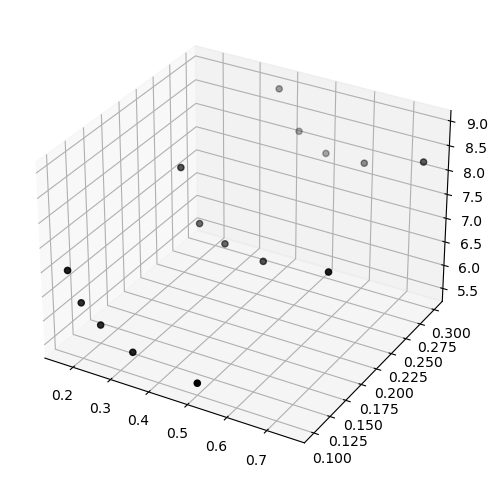

In [60]:
from_idx = 1000000
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(1, 1, 1, projection='3d')

table = []
for p, record in data_dict.items():
    if(p[1] ==  0):
        continue
    events, events_len = events_dict[p]
    running_lc  = np.cumsum(events_len**2)/(2*np.cumsum(events_len))
    lc = np.median(running_lc[from_idx:])
    l_cutoff = np.mean(events_len**2)/np.mean(events_len) 
    l_cutoff /= 2.0
    #hist, edges, _ = binned_statistic(events_len, record[:,-1], bins=np.logspace(0,5), statistic='mean')
    #hist, edges = np.histogram(events_len, bins=np.logspace(0,5), density=True)
    #plt.scatter(edges[:-1], hist)
    #ell_c = np.mean(events_len**3)/np.mean(events_len**2)
    #s_c = np.mean(record[:,-1]**3)/np.mean(record[:,-1]**2)
    #hist, edges = np.histogram(record[:,-1]/(s_c), density=True, bins=np.logspace(-5.5,1))
    #mask = hist > 0
    #hist = hist[mask]
    #edges = (edges[1:]+edges[:-1])/2
    #edges = edges[mask]
    #plt.scatter(edges, hist,  label="$k_0=%g,k_1=%g,k_2=%g$" % (p[0], p[1], p[2]))
#plt.plot(edges, 0.1*edges**(-1.8))
    #res = linregress(np.log(edges[15:20]), np.log(hist[15:20]))
    table.append((p[1],p[2], np.log(l_cutoff)))
table = np.array(table)
ax.scatter(table[:,1]/(table[:,0]+table[:,1]), table[:,1], table[:,2], c='black')
#plt.yscale('log')
#plt.xscale('log')
plt.show()
    #print(res)
    #plt.scatter(p[1], p[2], c=-res[0], vmin=1.5, vmax=2)
    #plt.text(p[1], p[2], "$%1.2f \pm %1.2f$" % (-res[0], res[4]))
#plt.colorbar()
#plt.xlabel("$k_1$")
#plt.ylabel("$k_2$")
#plt.tight_layout()
#plt.show()
    #plt.plot(edges, np.exp(np.log(edges)*res[0]+res[1]), label=(-res[0]))
    #plt.legend()
    #plt.yscale('log')
    #plt.xscale('log')
    #plt.show()

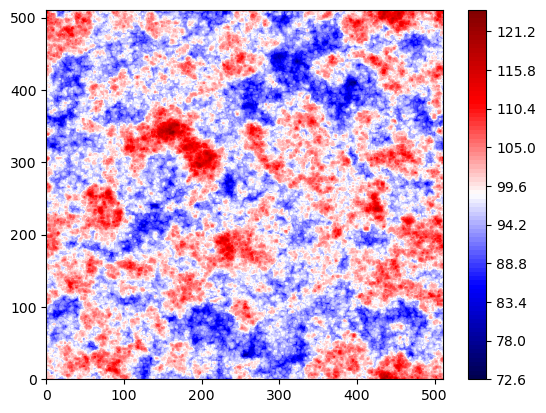

In [568]:
sorted_evs = np.argsort(events_len)
L = 512
image = np.zeros((L,L))
for forward in range(500000):
    ev = events[500000+forward]
    image[ev[:,0] % L,ev[:,0] // L] += ev[:,1]
plt.contourf(image, levels=100, cmap='seismic')
    #plt.scatter(, ev[:,0] % L, c=ev[:,1], cmap='seismic')
plt.colorbar()
plt.show()

In [431]:
sequences = np.split(data, np.argwhere(data[:,2]==0).flatten(), axis=0)[1:]
sequences_idx = np.split(np.arange(0, len(data)), np.argwhere(data[:,2]==0).flatten(), axis=0)[1:]

In [443]:
all_times = data[:,-2]
all_areas = []
all_idxs = []
for seq_cnt, seq_idx in enumerate(sequences_idx):
    if(len(seq_idx) < 100):
        continue
    print(seq_cnt)
    times = np.insert(np.cumsum(all_times[seq_idx[1:]]),0,0)
    img = np.zeros((L,L))
    areas = []
    for idx in seq_idx:
        coords = events[idx][:,0]
        img[coords // L, coords % L] += 1
        areas.append(len(np.argwhere(img)))
    areas = np.array(areas)
    all_areas.append(areas)
    all_idxs.append(seq_idx)

95532
96975
97148
97805
97832
98089
98253
98355
98468
98846
99002
99388
99439
99569
99680
99975
100302
100353
100415
100430
100485
100516
100656
100684
100711
100719
101103
101150
101162
101204
101214
101273
101371
101493
101544
101641
101799
101813
101835
101850
101855
101969
101989
101995
102047
102059
102086
102172
102302
102460
102472
102528
102580
102612
102617
102631
102664
102682
102697
102729
102753
102820
102865
102868
102882
103035
103165
103178
103250
103253
103518
103624
103726
103851
103882
103895
103933
103982
104042
104062
104077
104168
104210
104303
104361
104475
104485
104539
104599
104630
104644
104667
104685
104751
104752
104760
104768
104780
104882
104899
104955
105161
105190
105233
105235
105239
105287
105301
105378
105413
105504
105525
105568
105586
105617
105639
105650
105691
105692
105740
105747
105771
105882
105926
106006
106021
106082
106135
106212
106227
106329
106415
106424
106523
106533
106753
106760
106769
106799
106866
106964
107017
107054
107063
107075
1

In [444]:
area_vs_s = []
for seq_idx, areas in zip(all_idxs, all_areas):
    seq_S = data[seq_idx,-1]
    area_vs_s.append((seq_S.max(), areas[-1]))
area_vs_s = np.array(area_vs_s)

In [475]:
hist, edges, _ = binned_statistic(area_vs_s[:,1], area_vs_s[:,0], bins=np.logspace(2.5,4), statistic='median')

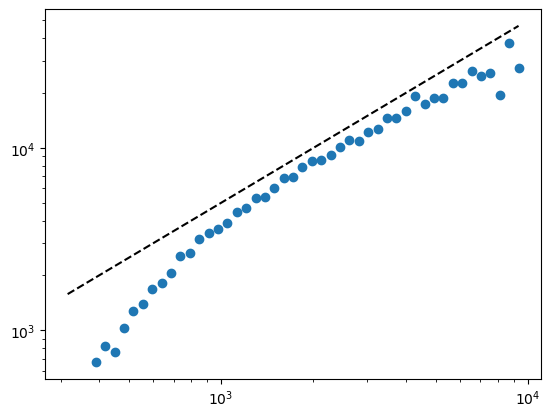

In [478]:
plt.scatter(edges[:-1], hist)
plt.plot(edges[:-1], 5*edges[:-1], ls='dashed', color='black')
plt.xscale('log')
plt.yscale('log')

LinregressResult(slope=1.161227739955956, intercept=12.6493543227838, rvalue=0.9612313174721199, pvalue=6.077970892891009e-28, stderr=0.048589842589685114, intercept_stderr=0.06462214342445521)

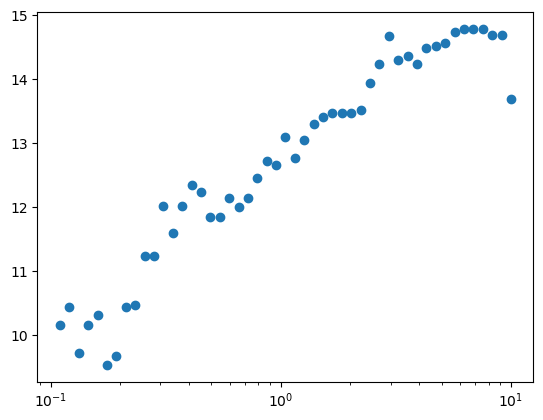

In [402]:
plt.scatter(edges[1:], hist)
plt.xscale('log')
linregress(np.log(edges[1:]), hist)

In [ ]:
seq_growth = []
total_size = []
for seq in sequences:
    if(len(seq) < 10):
        continue
    times = np.insert(np.cumsum(seq[1:,-2]),0,0)
    sizes = seq[:,-1]
    total_size.append(np.sum(sizes))
    seq_growth.append(np.vstack([times,np.cumsum(sizes**3)/np.cumsum(sizes**2)]).T)
seq_growth = np.concatenate(seq_growth)
total_size = np.array(total_size)

In [ ]:
hist, edges, _ = binned_statistic(seq_growth[:,0], np.log10(seq_growth[:,1]), bins=30, statistic='median')

LinregressResult(slope=1482.9538810050963, intercept=4960.803520408163, rvalue=0.972721781610214, pvalue=1.7816122353295526e-31, stderr=51.58589810884662, intercept_stderr=68.60675253508415)

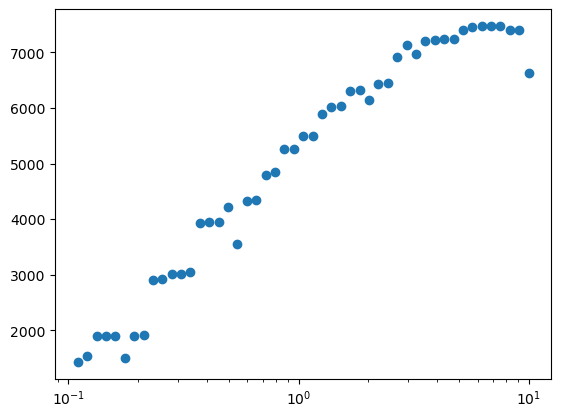

In [ ]:
hist, edges = np.histogram(total_size, density=True, bins=np.logspace(1, 5.5))
plt.scatter(edges[:-1], hist)
plt.plot(edges, 0.8*edges**(-1.27))
plt.plot(edges, 0.95*edges**(-1.7))
plt.yscale('log')
plt.xscale('log')